# AWS Re:Invent  Autogluon Workshop
### This workshop will demonstrate a machine learning problem solved by autogluon.
* The problem we want to solve in this tutorial is Shopee clothes labeling. The problem is exctracted from [this kaggle competition](https://www.kaggle.com/datasets/gpiosenka/sports-classification)
* Use the documentation of autogluon and the different tutorials [here](https://auto.gluon.ai/stable/index.html).

In [1]:
# Installation
!pip3 install -U pip
!pip3 install -U setuptools wheel

# Install the proper version of PyTorch following https://pytorch.org/get-started/locally/
!pip3 install torch==1.12.0+cu113 torchvision==0.13.0+cu113 torchtext==0.13.0 --extra-index-url https://download.pytorch.org/whl/cu113

!pip3 install "mxnet_cu101<2.0.0, >=1.7.0"    
    
!pip3 install autogluon

Looking in indexes: https://pypi.org/simple, https://pip.repos.neuron.amazonaws.com
Looking in indexes: https://pypi.org/simple, https://pip.repos.neuron.amazonaws.com
Looking in indexes: https://pypi.org/simple, https://pip.repos.neuron.amazonaws.com, https://download.pytorch.org/whl/cu113
Looking in indexes: https://pypi.org/simple, https://pip.repos.neuron.amazonaws.com
Looking in indexes: https://pypi.org/simple, https://pip.repos.neuron.amazonaws.com


In [2]:
import torch
torch.cuda.is_available()

True

In [3]:
print(torch.version.cuda)

11.3


In [47]:
def my_evaluate(predictor, test_dataset):
    tmp_df = test_dataset.copy()
    tmp_df['prediction'] = predictor.predict(test_dataset)
    accuracy = (tmp_df['prediction']==tmp_df['labels']).sum() / tmp_df.shape[0]
    return accuracy

In [4]:
# import autogluon tools.
import autogluon
import autogluon.core as ag
from autogluon.vision import ImageDataset, ImagePredictor

import pandas as pd

/home/ec2-user/anaconda3/envs/JupyterSystemEnv/lib/python3.7/site-packages/gluoncv/__init__.py:40: UserWarning: Both `mxnet==1.9.1` and `torch==1.12.0+cu113` are installed. You might encounter increased GPU memory footprint if both framework are used at the same time.
  warnings.warn(f'Both `mxnet=={mx.__version__}` and `torch=={torch.__version__}` are installed. '


### Download the dataset from kaggle
* [website](https://www.kaggle.com/datasets/gpiosenka/sports-classification/download?datasetVersionNumber=8)
* upload the archive to the Dataset folder and unzip it

In [5]:
# unzip the dataset
#!mkdir Datasets/image-data 
#!unzip Datasets/archive-image.zip -d Datasets/image-data/

In [6]:
csv_file = 'Datasets/image-data/sports.csv'
df = pd.read_csv(csv_file)
df.head()

,filepaths,labels,data set
0,train/air hockey/001.jpg,air hockey,train
1,train/air hockey/002.jpg,air hockey,train
2,train/air hockey/003.jpg,air hockey,train
3,train/air hockey/004.jpg,air hockey,train
4,train/air hockey/005.jpg,air hockey,train


In [7]:
df['image'] = 'Datasets/image-data/' + df['filepaths']
df = df.drop(columns='filepaths')

In [8]:
df.to_csv('image_dataset.csv')

In [9]:
df_image = ImageDataset.from_csv('image_dataset.csv')
df_image.head()

,Unnamed: 0,labels,data set,image
0,0,air hockey,train,Datasets/image-data/train/air hockey/001.jpg
1,1,air hockey,train,Datasets/image-data/train/air hockey/002.jpg
2,2,air hockey,train,Datasets/image-data/train/air hockey/003.jpg
3,3,air hockey,train,Datasets/image-data/train/air hockey/004.jpg
4,4,air hockey,train,Datasets/image-data/train/air hockey/005.jpg


In [10]:
df_image['data set'].unique()

array(['train', 'test', 'valid'], dtype=object)

In [11]:
label = 'labels'

In [12]:
train_dataset = df_image.loc[df_image['data set']=='train',
                             ['labels','image']
                            ].copy().reset_index(drop = True)
val_dataset = df_image.loc[df_image['data set']=='valid',
                           ['labels','image']
                          ].copy().reset_index(drop = True)
test_dataset = df_image.loc[df_image['data set']=='test',
                            ['labels','image']
                           ].copy().reset_index(drop = True)

In [13]:
train_dataset.head()

,labels,image
0,air hockey,Datasets/image-data/train/air hockey/001.jpg
1,air hockey,Datasets/image-data/train/air hockey/002.jpg
2,air hockey,Datasets/image-data/train/air hockey/003.jpg
3,air hockey,Datasets/image-data/train/air hockey/004.jpg
4,air hockey,Datasets/image-data/train/air hockey/005.jpg


In [14]:
test_dataset.head()

,labels,image
0,air hockey,Datasets/image-data/test/air hockey/1.jpg
1,air hockey,Datasets/image-data/test/air hockey/2.jpg
2,air hockey,Datasets/image-data/test/air hockey/3.jpg
3,air hockey,Datasets/image-data/test/air hockey/4.jpg
4,air hockey,Datasets/image-data/test/air hockey/5.jpg


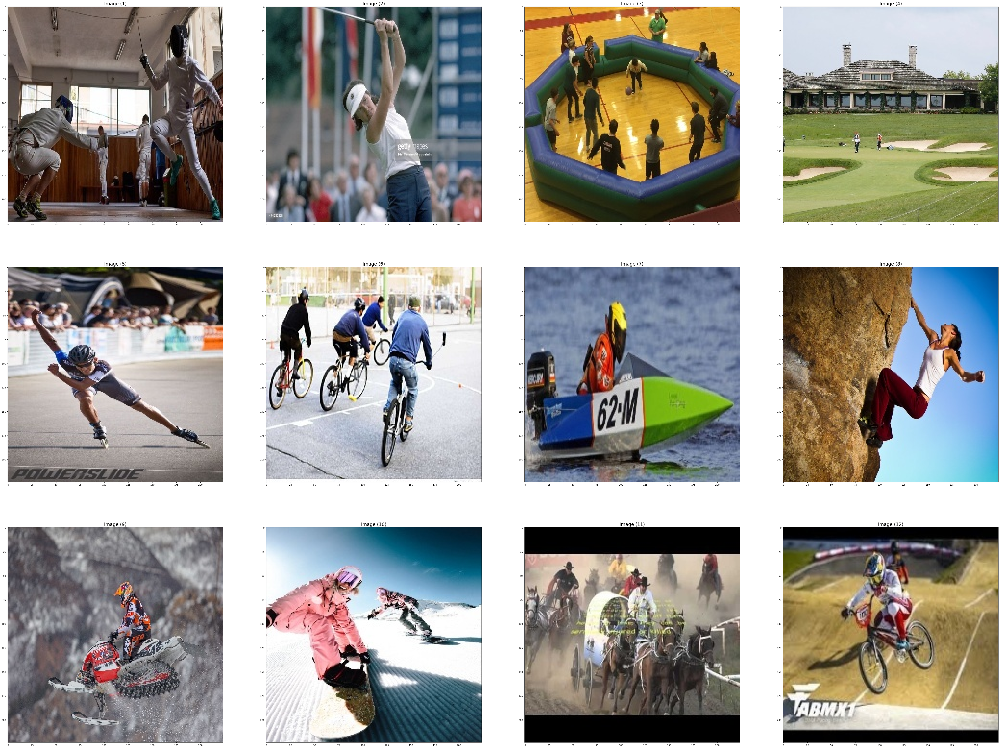

In [15]:
df_image.sample(frac=1).iloc[:12].show_images()

### Labels
* Sports

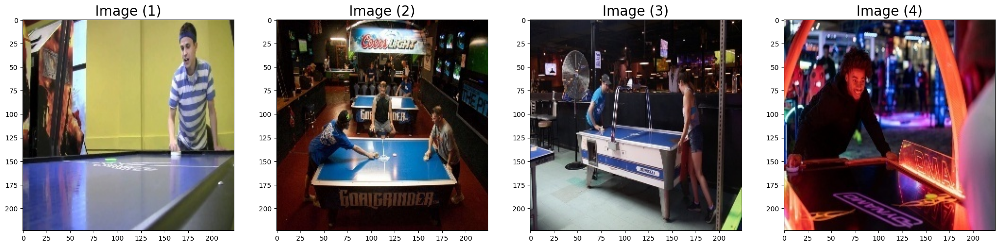

In [16]:
train_dataset.loc[train_dataset['labels']=='air hockey'].iloc[:4].show_images()

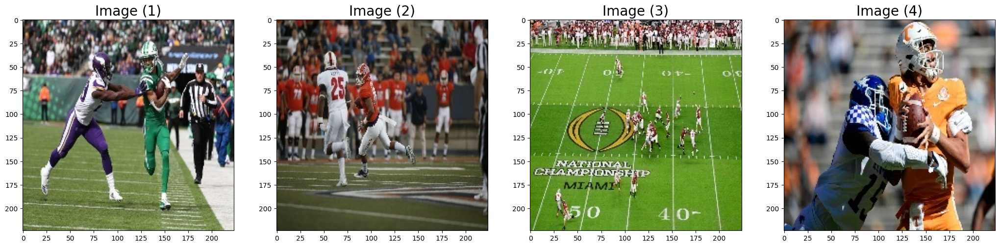

In [17]:
train_dataset.loc[train_dataset['labels']=='football'].iloc[:4].show_images()

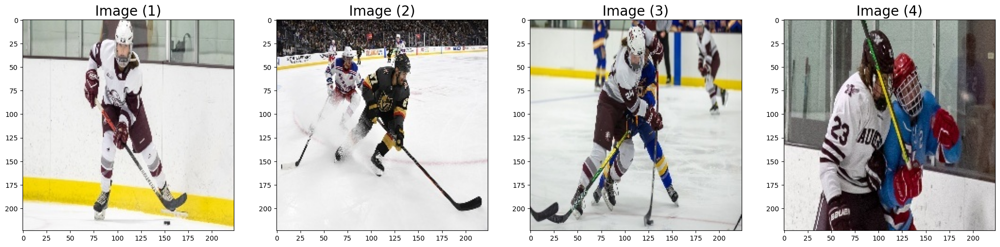

In [18]:
train_dataset.loc[train_dataset['labels']=='hockey'].iloc[:4].show_images()

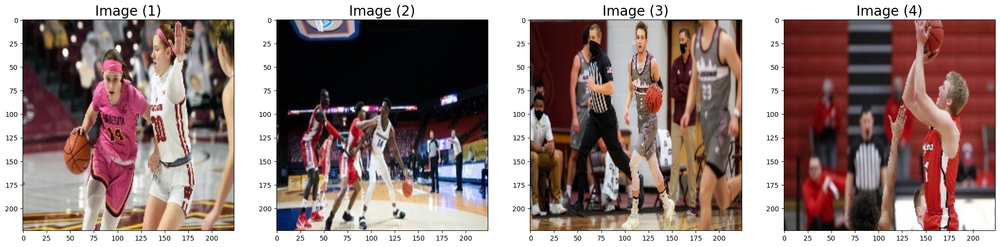

In [19]:
train_dataset.loc[train_dataset['labels']=='basketball'].iloc[:4].show_images()

### Let's use the default config and take a time limit of 5 min.

In [20]:
# Set up the predictor. Mention the label when you call the predictor
predictor = ImagePredictor(label=label)

# Fit the predictor with the train dataset and tune it with the validation dataset. Put a time limit of 5 min.
predictor.fit(train_dataset, tuning_data=val_dataset , time_limit=5*60)  

Reset labels to ['air hockey', 'ampute football', 'archery', 'arm wrestling', 'axe throwing', 'balance beam', 'barell racing', 'baseball', 'basketball', 'baton twirling', 'bike polo', 'billiards', 'bmx', 'bobsled', 'bowling', 'boxing', 'bull riding', 'bungee jumping', 'canoe slamon', 'cheerleading', 'chuckwagon racing', 'cricket', 'croquet', 'curling', 'disc golf', 'fencing', 'field hockey', 'figure skating men', 'figure skating pairs', 'figure skating women', 'fly fishing', 'football', 'formula 1 racing', 'frisbee', 'gaga', 'giant slalom', 'golf', 'hammer throw', 'hang gliding', 'harness racing', 'high jump', 'hockey', 'horse jumping', 'horse racing', 'horseshoe pitching', 'hurdles', 'hydroplane racing', 'ice climbing', 'ice yachting', 'jai alai', 'javelin', 'jousting', 'judo', 'lacrosse', 'log rolling', 'luge', 'motorcycle racing', 'mushing', 'nascar racing', 'olympic wrestling', 'parallel bar', 'pole climbing', 'pole dancing', 'pole vault', 'polo', 'pommel horse', 'rings', 'rock cli

### The default model is resnet50, with the best config printed just above.

In [21]:
# print the train, val accuracy.
fit_result = predictor.fit_summary()
print('Top-1 train acc: %.3f, val acc: %.3f' %(fit_result['train_acc'], fit_result['valid_acc']))

Top-1 train acc: 0.007, val acc: -inf


In [22]:
# Evaluate the predictor on the test dataset
# set the true values
y_test = test_dataset[label]  
# delete label column to prove we're not cheating
test_data_nolab = test_dataset.drop(columns=[label])  

In [23]:
# predict on the test dataset without label
y_pred = predictor.predict(test_data_nolab)
# evalute your predictions vs the true labels with evaluate_predictions function.
resutls = my_evaluate(predictor, test_dataset)
print('Test acc on hold-out data:', results)

In [24]:
# print a prediction of one element of the test dataset
image_index = 0
image_path = test_dataset.iloc[image_index]['image']
result = predictor.predict(image_path)
print(result)

0    ice climbing
Name: labels, dtype: object


### let's have look to test subsample.

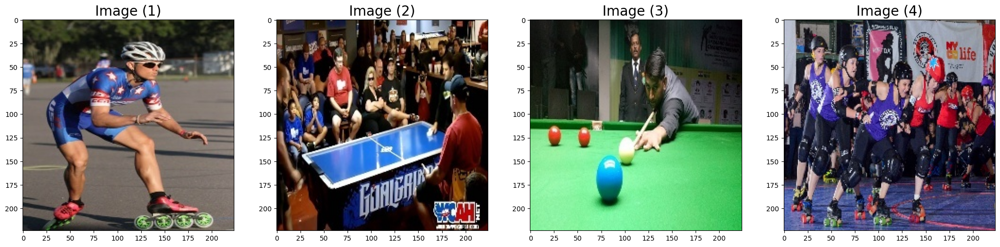

In [25]:
# print some test data images and create a subsample to see the prediction of the images.
test_sample = test_dataset.sample(frac=1).iloc[:4]
test_sample.show_images()

In [26]:
# print the predictions of the sub sample.
bulk_result = predictor.predict(test_sample)
bulk_result

1            jousting
340    bungee jumping
59            trapeze
347      pommel horse
Name: labels, dtype: object

In [27]:
# print the true labels.
test_sample.labels

1              air hockey
340          roller derby
59              billiards
347    rollerblade racing
Name: labels, dtype: object

## Let's try specific models

In [28]:
# print the list of available models.
ImagePredictor.list_models()

('resnet18_v1',
 'resnet34_v1',
 'resnet50_v1',
 'resnet101_v1',
 'resnet152_v1',
 'resnet18_v2',
 'resnet34_v2',
 'resnet50_v2',
 'resnet101_v2',
 'resnet152_v2',
 'resnest14',
 'resnest26',
 'resnest50',
 'resnest101',
 'resnest200',
 'resnest269',
 'se_resnet18_v1',
 'se_resnet34_v1',
 'se_resnet50_v1',
 'se_resnet101_v1',
 'se_resnet152_v1',
 'se_resnet18_v2',
 'se_resnet34_v2',
 'se_resnet50_v2',
 'se_resnet101_v2',
 'se_resnet152_v2',
 'vgg11',
 'vgg13',
 'vgg16',
 'vgg19',
 'vgg11_bn',
 'vgg13_bn',
 'vgg16_bn',
 'vgg19_bn',
 'alexnet',
 'densenet121',
 'densenet161',
 'densenet169',
 'densenet201',
 'shufflenet_v1',
 'shufflenet_v2',
 'squeezenet1.0',
 'squeezenet1.1',
 'googlenet',
 'inceptionv3',
 'xception',
 'xception71',
 'mobilenet1.0',
 'mobilenet0.75',
 'mobilenet0.5',
 'mobilenet0.25',
 'mobilenetv2_1.0',
 'mobilenetv2_0.75',
 'mobilenetv2_0.5',
 'mobilenetv2_0.25',
 'mobilenetv3_large',
 'mobilenetv3_small',
 'cifar_resnet20_v1',
 'cifar_resnet56_v1',
 'cifar_resnet110

In [29]:
# create your set of model to try.
model = ag.Categorical('resnet18_v1b', 'mobilenetv3_small','vgg19','mobilenetv3_small_100','inception_v3')

In [30]:
# set up your hyperparameters.
batch_size = 16
lr = ag.Categorical(1e-2, 1e-3)
hyperparameters={'model': model, 'batch_size': batch_size, 'lr': lr}

In [34]:
train_dataset = df_image.loc[df_image['data set']=='train',
                             ['labels','image']
                            ].copy().reset_index(drop = True)
val_dataset = df_image.loc[df_image['data set']=='valid',
                           ['labels','image']
                          ].copy().reset_index(drop = True)
test_dataset = df_image.loc[df_image['data set']=='test',
                            ['labels','image']
                           ].copy().reset_index(drop = True)

In [36]:
# set up your predictor
predictor = ImagePredictor(label=label)
# fit the predictor with the train dataset, val dataset, the hyperparameters and set a time limit of 5 min.
predictor.fit(train_dataset, 
              tuning_data=val_dataset,
              time_limit=5*60, 
              hyperparameters=hyperparameters)
print('Top-1 val acc: %.3f' % predictor.fit_summary()['valid_acc'])

ImagePredictor sets accuracy as default eval_metric for classification problems.
Reset labels to ['air hockey', 'ampute football', 'archery', 'arm wrestling', 'axe throwing', 'balance beam', 'barell racing', 'baseball', 'basketball', 'baton twirling', 'bike polo', 'billiards', 'bmx', 'bobsled', 'bowling', 'boxing', 'bull riding', 'bungee jumping', 'canoe slamon', 'cheerleading', 'chuckwagon racing', 'cricket', 'croquet', 'curling', 'disc golf', 'fencing', 'field hockey', 'figure skating men', 'figure skating pairs', 'figure skating women', 'fly fishing', 'football', 'formula 1 racing', 'frisbee', 'gaga', 'giant slalom', 'golf', 'hammer throw', 'hang gliding', 'harness racing', 'high jump', 'hockey', 'horse jumping', 'horse racing', 'horseshoe pitching', 'hurdles', 'hydroplane racing', 'ice climbing', 'ice yachting', 'jai alai', 'javelin', 'jousting', 'judo', 'lacrosse', 'log rolling', 'luge', 'motorcycle racing', 'mushing', 'nascar racing', 'olympic wrestling', 'parallel bar', 'pole cl

Top-1 val acc: -inf


In [43]:
# Evaluate the predictor on the test dataset
# results = my_evaluate(predictor, test_dataset)
# print('Test acc on hold-out data:', results)

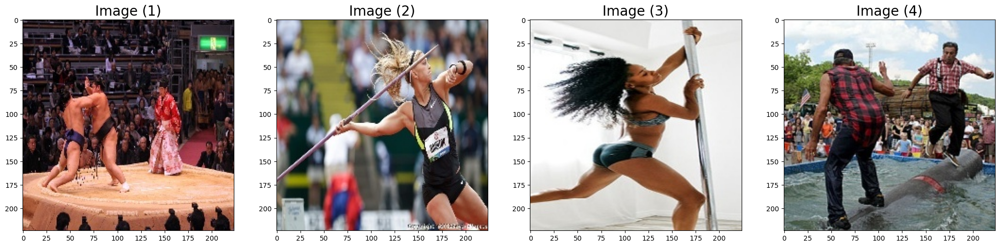

In [38]:
# Create a new sub sample of the test data set.
test_sample = test_dataset.sample(frac=1).iloc[:4]
test_sample.show_images()

In [39]:
# print the prediction of this sub sample.
bulk_result = predictor.predict(test_sample)
bulk_result

250              javelin
273           tug of war
418           tug of war
311    olympic wrestling
Name: labels, dtype: object

In [41]:
# print the true labels.
test_sample.labels

250           javelin
273       log rolling
418    sumo wrestling
311      pole dancing
Name: labels, dtype: object

# Optional
### Let's see the result with more training time

In [ ]:
# you can try to train your predictor with more time.
hyperparameters={'model': model, 'batch_size': batch_size, 'lr': lr}

predictor = ImagePredictor(label=label)
predictor.fit(train_dataset,
              time_limit=20*60, 
              hyperparameters=hyperparameters
             )
print('Top-1 val acc: %.3f' % predictor.fit_summary()['valid_acc'])

In [ ]:
# evaluate it
# results = predictor.evaluate(test_dataset)
# print('Test acc on hold-out data:', results)